# ENG 10: HW 2 (Functions of Multiple Variables, Partial Derivatives, and Gradients)

In this homework, you will learn partial derivatives and gradients of multivariable systems.

### Goals
- Learn how to create 3D surface plot and vectors in 3D
- Learn how to graphically depict slices
- Edge detection of images

### Requirements
- python 3.x
- jupyter notebook
- matplotlib
- ipywidgets
- sympy
- plotly
- chart_studio
- pandas
- skimage

**NOTE:** You may need to install new packages for your Python install. If you're using Anaconda, open Terminal (Mac, Linux) or Anaconda Prompt (Windows) and type <font face="monospace">conda install plotly</font>. If you're using a different distribution manager, try the command <font face="monospace">pip install plotly</font> or Google how to use your package manger. If you encounter a dependency error for chart_studio, use the same commands as above but install <font face="monospace">chart_studio</font> instead of <font face="monospace">plotly</font>.

In [1]:
# ensure code is compatible with both Python 2.7 and 3.x
from __future__ import print_function, division

# load required packages
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# extra plotting tools (for 3D plots)
from mpl_toolkits.mplot3d import axes3d

# enable interactive plots with matplotlib
from ipywidgets.widgets import interact, fixed, FloatSlider

# another interactive ploting tool which can be embeded into HTML and Powerpoint slides
# Plotly Offline brings interactive Plotly graphs to the offline (local) environment. Instead of saving the graphs to a server, your data and graphs will remain in your local system.
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go

# You can also plot your graphs offline inside a Jupyter Notebook Environment. First you need to initiate the Plotly Notebook mode as below:
init_notebook_mode(connected=True)

# enable reading csv data
import pandas as pd

## 0) 3D Surface Plot
Since we'll be dealing with functions of multiple variables, we need to consider how we will visualize such functions. Although there are many options, let's start by focusing on a 3D surface plot.

## 0.1) Example multivariable function: $f(x, y) = \sin(\pi x)\sin (\pi y) - 0.1x^3 + 0.2y^2$
We'll start with a function of two variables ($x$ and $y$):

$$
f(x, y) = \sin(\pi x)\sin (\pi y) - 0.1x^3 + 0.2y^2
$$

In this section, we will explore the behavior of the function and its partial derivatives.

First of all, let's define f(x,y) = z

In [2]:
# define f(x,y) using the numpy version of sine
def f(x,y):
    return np.sin(np.pi * x) * np.sin(np.pi * y) - 0.1 * x**3 + 0.2 * y**2

When creating mathematical functions that use NumPy functions as operators, the function can work with scalar values, vectors, or arrays! It calculates them in an element-by-element fashion. Give it a try below:

In [3]:
x_scalar = 5
y_scalar = 6
z_scalar = f(x_scalar, y_scalar)
print(z_scalar)

x_vector = np.array([1, 2, 3])
y_vector = np.array([4, 5, 6])
z_vector = f(x_vector, y_vector)

-5.3


In [4]:
print(z_vector)

x_matrix = np.array([[[1, 2], [3, 4]]])
y_matrix = np.array([[[5, 6], [7, 8]]])
z_matrix = f(x_matrix, y_matrix)
print(z_matrix)

[3.1 4.2 4.5]
[[[4.9 6.4]
  [7.1 6.4]]]


When you plot 3D surface using functions, you need to create a set of (x, y) points with an associated value over a wide range of values of x and y.

To do that, the customized function <b><font color="blue">f</font></b> (x, y) and <b>meshgrid</b> from NumPy will be used to create a rectangular grid out of NumPy arrays of x values and y values.

Let's create a range of values of x and y using NumPy arange instead of linspace, and then create a matrix containing unique (x, y) points for each entry in x and y.

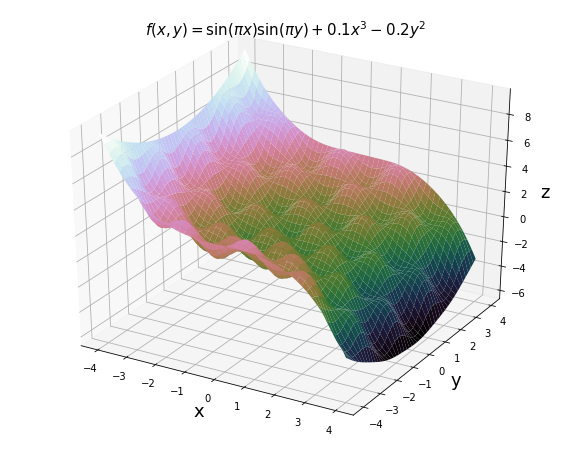

In [5]:
# setup the 3D grid of points
x = np.arange(-4, 4, 0.01)
y = np.arange(-4, 4, 0.01)

# restructure the variables for use in the 3D plot
x_mesh, y_mesh = np.meshgrid(x, y)

# calculate the function values
z_mesh = f(x_mesh, y_mesh)

# initialize the 3D figure
fig = plt.figure(figsize=(10, 8))
ax = fig.gca(projection='3d')

# plot the surface
ax.plot_surface(x_mesh, y_mesh, z_mesh, cmap='cubehelix')

# add labels
ax.set_xlabel('x', fontsize = 18)
ax.set_ylabel('y', fontsize = 18)
ax.set_zlabel('z', fontsize = 18)

# Writing mathematical expressions: https://matplotlib.org/users/mathtext.html
plt.title('$f(x,y) =\mathrm{sin}(\pi x)\mathrm{sin}(\pi y) + 0.1x^3 - 0.2y^2$', fontsize = 15)


plt.show()

**- Question:**
Change the step sizes to 1, 0.1, 0.01, and 0.001 for x and y. Describe 1) How does your plot shape look with step size of 1, 0.1, 0.01 and 0.001? 2) How did the speed of computation change with different step sizes? 3) In practice, engineers have to make tradeoffs between performance (i.e. how smooth the curve is) and speed (i.e. how long it takes to calculate). What would you select as a a good step size value for x and y from a practical engineering perspective? Why?

**Answer:**
0.01 because it is relatively fast to calculate and accurate enough for our purpose.

**- Question:** Try out other colormaps (i.e. change ``cmap`` in the code). Pick one that you think is "best". Your 3D plot in the code cell above should have a different colormap. 

Examples:
- ``Reds``
- ``BuPu``
- ``cubehelix``

Full list of built-in Matplotlib colormaps: http://matplotlib.org/examples/color/colormaps_reference.html

## 0.2) Interactive 3D Plot with 2 subplots with slices
Let's take a step further and plot the 3D surface side-by-side with the slices. Run this code **as-is** and play around with the interactive sliders.

**NOTE:** The code may be slow to refresh, so be patient.

In [7]:
def plot_surface(x0, y0):
    
    # resolution
    delta = 0.1
    
    # set up the three subfigures
    fig = plt.figure(figsize=(20, 8))
    ax_3d = fig.add_subplot(1, 2, 1, projection='3d')
    ax_x_slice = fig.add_subplot(2, 2, 2)
    ax_y_slice = fig.add_subplot(2, 2, 4)
    
    #===========================
    # plot the x-slice (f(x0, y) vs. y with x=constant)
    x = x0
    y = np.arange(-4, 4, delta)
    z = f(x, y)
    ax_x_slice.plot(y, z, color='red')
    
    # add labels
    ax_x_slice.set_xlabel('$y$', fontsize = 18)
    ax_x_slice.set_ylabel('$f(x_{0}, y)$', fontsize = 18)
    
    #===========================
    # plot the y-slice (f(x, y0) vs. x with y=constant)
    x = np.arange(-4, 4, delta)
    y = y0
    z = f(x, y)
    ax_y_slice.plot(x, z, color='blue', linestyle='--')
    
    # add labels
    ax_y_slice.set_xlabel('$x$', fontsize = 18)
    ax_y_slice.set_ylabel('$f(x, y_{0})$', fontsize = 18)
    
    #===========================
    # plot the 3D surface
    x = np.arange(-4, 4, delta)
    y = np.arange(-4, 4, delta)
    x_mesh, y_mesh = np.meshgrid(x, y)
    z_mesh = f(x_mesh, y_mesh)
    ax_3d.plot_surface(x_mesh, y_mesh, z_mesh, cmap='Blues',
                      rstride=2,
                      cstride=2,
                      linewidth=0,
                      antialiased=True)
    
    # add labels
    ax_3d.set_xlabel('x', fontsize = 18)
    ax_3d.set_ylabel('y', fontsize = 18)
    ax_3d.set_zlabel('f(x, y)', fontsize = 18)
    
    # add the x-slice onto the 3D plot
    y = np.arange(-4, 4, delta)
    x = np.ones_like(y) * x0
    z = f(x, y)
    ax_3d.plot(x, y, z, color='red', linestyle='-', linewidth=2)
    
    # add the y-slice onto the 3D plot
    x = np.arange(-4, 4, delta)
    y = np.ones_like(x) * y0
    z = f(x, y)
    ax_3d.plot(x, y, z, color='blue', linestyle='--', linewidth=2)
    
    
    # change the viewing angle of the 3D plot
    ax_3d.view_init(30, 60)
    plt.draw()
    
    # show the plot
    plt.show()
    

# try it out
interact(plot_surface,
         x0=FloatSlider(min=-4, max=4, step=0.1, continuous_update=False),
         y0=FloatSlider(min=-4, max=4, step=0.1, continuous_update=False)
        )

interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='x0', max=4.0, min=-4.0), Fl…

<function __main__.plot_surface(x0, y0)>

## 1.1) 3D Interactive surface plots from external data with Plotly
In the code below, we'll visualize the elevation of Mt Bruno (aka San Bruno Mountain), which is a mountain in San Mateo County, CA. The idea is to load the elevation data and then visualize it in 3D. Although we're using measured data, the same concepts will apply when working with mathematical functions.

More info on the mountain:
- Google Maps link: https://goo.gl/maps/QWfLdQ8zCay
- Wikipedia page: https://en.wikipedia.org/wiki/San_Bruno_Mountain

In [8]:
# Read csv data by using panda: mt_bruno_elevation.csv
elevation = pd.read_csv('mt_bruno_elevation.csv')

# Try the following colorscales:
#‘Blackbody’, ‘Bluered’, ‘Blues’, ‘Earth’, ‘Electric’, ‘Greens’, ‘Greys’, ‘Hot’, ‘Jet’, ‘Picnic’, ‘Portland’,
#‘Rainbow’, ‘RdBu’, ‘Reds’, ‘Viridis’, ‘YlGnBu’, ‘YlOrRd’

# Assign csv data to a variable (z should be a 2D list.); go = plotly.graph_objs
data = [go.Surface(z=elevation.as_matrix(),colorscale='Earth')]

# Set up the layout of the 3d surface plot
layout = go.Layout(title='Mt. Bruno Elevation', autosize=False,width=1000,height=500,margin=dict(l=65,r=50,b=65,t=90))

# Create a new figure
fig = go.Figure(data=data, layout=layout)

# Plot your plotly figure offline
iplot(fig, filename='Mt_Bruno_Elevation')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



**- Try the following Plotly color scale for your 3D surface:**

'Greys', 'YlGnBu', 'Greens', 'YlOrRd', 'Bluered', 'RdBu', 'Reds', 'Blues', 'Picnic', 'Rainbow', 'Portland', 'Jet','Hot', 'Blackbody', 'Earth', 'Electric', 'Viridis', 'Cividis'

## 1.2) More practice
Create another plot of volcano from 'volcano_elevation.csv' in the bellow cell.

In [12]:
# Read csv data by using panda: volcano_elevation.csv
elevation = pd.read_csv('volcano_elevation.csv')

# This csv file is also availalbe in the following URL: 
# https://raw.githubusercontent.com/plotly/datasets/master/volcano.csv

# Try the following colorscales:
#‘Blackbody’, ‘Bluered’, ‘Blues’, ‘Earth’, ‘Electric’, ‘Greens’, ‘Greys’, ‘Hot’, ‘Jet’, ‘Picnic’, ‘Portland’,
#‘Rainbow’, ‘RdBu’, ‘Reds’, ‘Viridis’, ‘YlGnBu’, ‘YlOrRd’

# Assign csv data to a variable (z should be a 2D list.); go = plotly.graph_objs
data = [go.Surface(z=elevation.as_matrix(),colorscale='Portland')]

# Set up the layout of the 3d surface plot
layout = go.Layout(title='Volcano Elevation', autosize=False,width=500,height=500,margin=dict(l=65,r=50,b=65,t=90))

# Create a new figure
fig = go.Figure(data, layout)

# Plot your plotly figure offline
iplot(fig, filename='Volcano Elevation')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: FutureWarning:

Method .as_matrix will be removed in a future version. Use .values instead.



**Question: **
What is the dimension of the csv data of volcano?

**Answer:**
3

## 2) Image Processing


## 2.1) Load and display an Image 
Let's load a color image and display it.

[[[ 60 124 186]
  [ 60 124 186]
  [ 60 124 186]
  ...
  [ 69 148 225]
  [ 69 148 225]
  [ 69 148 225]]

 [[ 60 124 186]
  [ 60 124 186]
  [ 60 124 186]
  ...
  [ 69 148 225]
  [ 69 148 225]
  [ 69 148 225]]

 [[ 60 124 186]
  [ 60 124 186]
  [ 60 124 186]
  ...
  [ 69 148 225]
  [ 69 148 225]
  [ 69 148 225]]

 ...

 [[ 63 133 202]
  [ 63 133 202]
  [ 63 133 202]
  ...
  [ 77 168 247]
  [ 77 168 247]
  [ 77 168 247]]

 [[ 63 133 202]
  [ 63 133 202]
  [ 63 133 202]
  ...
  [ 78 170 247]
  [ 78 170 247]
  [ 78 170 247]]

 [[ 63 134 200]
  [ 63 134 200]
  [ 63 134 200]
  ...
  [ 80 170 246]
  [ 79 169 245]
  [ 79 169 245]]]
(584, 920, 3)
<class 'numpy.ndarray'>


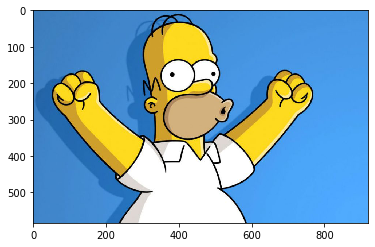

In [13]:
# read an Homer Simpson image: simpsons.jpg
img=mpimg.imread('simpsons.jpg')

# print the following 4 info
print(img)         #print the data of the image
plt.imshow(img)    #print the image
print(img.shape)   #print the data shape of the image
print(type(img))   #print the data type of the image

**Question:**
What is the dimension of a color image data?

**Answer:**
2

## 2.2) RGB (Color) to Grayscale
We can change RGB image to grayscale.
Let's see how it works.

[[111.932 111.932 111.932 ... 133.157 133.157 133.157]
 [111.932 111.932 111.932 ... 133.157 133.157 133.157]
 [111.932 111.932 111.932 ... 133.157 133.157 133.157]
 ...
 [119.936 119.936 119.936 ... 149.797 149.797 149.797]
 [119.936 119.936 119.936 ... 151.27  151.27  151.27 ]
 [120.295 120.295 120.295 ... 151.754 150.754 150.754]]
(584, 920)
<class 'numpy.ndarray'>


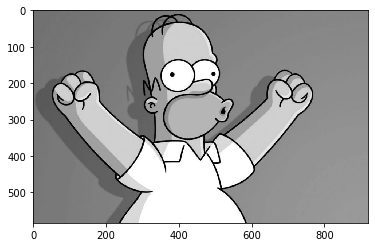

In [15]:
# dot product of two arrays
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

img = mpimg.imread('simpsons.jpg')  

# change rgb to gray
gray = rgb2gray(img) 

# print the gray image
plt.imshow(gray, cmap = plt.get_cmap('gray'))

print(gray)        #print the data of the image
print(gray.shape)  #print the data shape of the image
print(type(gray))  #print the data type of the image

**Question:**
What is the dimension of a gray image data?

**Answer:**
2

## 2.3) Grayscale to 3D interactive plot
Let's create an 3D interactive plot from the grascale.

In [16]:
iplot([dict(z=gray, type='surface'),], filename='3D_Homer')

**Question: **
Take a closer look at the edge line of the 3D surface plot of Homor's gray image. Can you see the huge difference in intensity value around the edge? That is the mathematical meaning of an edge of images. Then, how do we let computers detect the edge of images?

**Answer:**
Detect differences in the intensity of images between pixels that are close to one another.

## 2.4) Canny Edge Detector

In [17]:
from skimage import data
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.morphology import watershed
from scipy import ndimage as ndi
from skimage.filters import roberts, sobel, scharr, prewitt

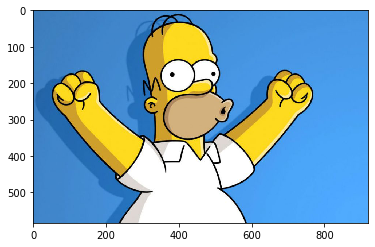

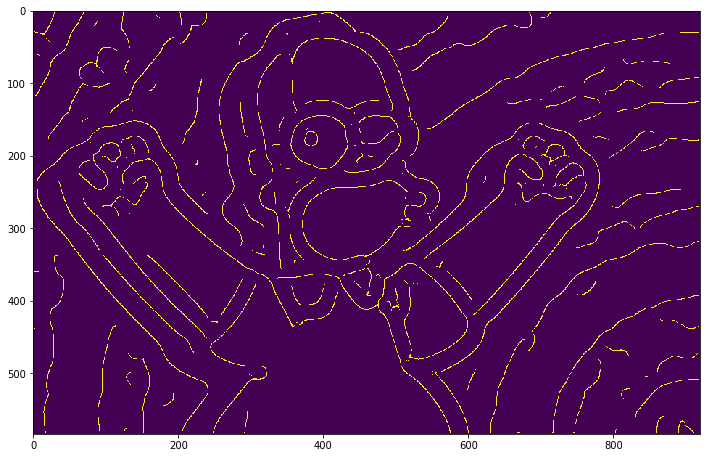

In [37]:
# Define Canny Filter
def show_img(img):
    width = img.shape[1]/75.0
    height = img.shape[0]*width/img.shape[1]
    f = plt.figure(figsize=(width, height))
    plt.imshow(img)
    plt.show()

# print original image
imgplot = plt.imshow(img)

# Change the filter size (sigma = any number greater than 0.1)
edges = canny(gray, sigma=10)

# print an image after Canny Filter
show_img(edges)

**Question:**
Change the filter size (sigma) from 1, 5, 10, 20, 50. Describe how the results change with different filter size. And, answer what filter size is the optimum to show the most stisfying result in this example? (This value does not need to be accurate.)

**Answer:** 10


## 3) Example multivariable function: $f(x, y) = x^2 + \sin (y^2)$
We'll start with a function of two variables ($x$ and $y$):

$$
f(x, y) = x^2 + \sin (y^2)
$$

In this section, we will explore the behavior of the function and its partial derivatives.

## 3.1) Plot slices along the y-axis
We'll begin by  plotting slices of the function along the y-axis. In other words, plot $f(x, y)$ vs. $x$ with a set value of $y$ (e.g. 0.5).

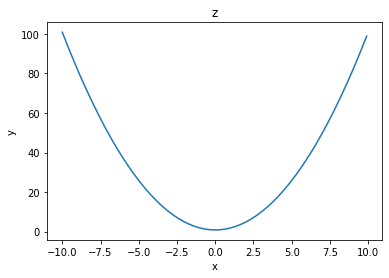

In [24]:
# choose a range of x values to plot
x = np.arange(-10, 10, 0.1)

# pick a y value where we'll "slice" the plot (so it's only 2D)
y = 1

# calculate f(x, y)
z = pow(x, 2) + np.sin(pow(y, 2))

# plot f(x, y) vs x
plt.plot(x, z)

# add labels
plt.xlabel('x')
plt.ylabel('y')
plt.title('z')

plt.show()

**Task:** Try plotting the function at multiple values of $y$, from -3 to +3. 

**NOTE:** The third parameter of NumPy's <font face="monospace">arange</font> function is resolution. Make sure to set a small enough resolution in order to visualize the trends of the following plots!

**Question:** What shape does the function resemble along the y-axis? I.e. as you change the value of $y$, what shape does the plot seem to outline?

**Answer:** A quadratic function. 

## 3.2) Plot slices along the x-axis
Do the same as above, but for fixed values of $x$ (i.e. plot $f(x, y)$ vs. $y$).

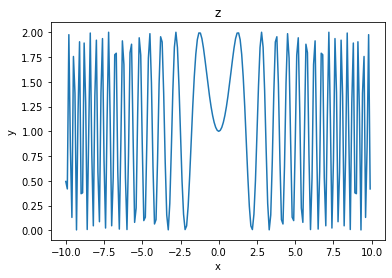

In [26]:
# choose a range of y values to plot
y = np.arange(-10, 10, 0.1)

# pick a x value where we'll "slice" the plot (so it's only 2D)
x = 1

# calculate f(x, y)
z = x**2 + np.sin(y**2)

# plot f(x, y) vs y
plt.plot(y, z)

# add labels
plt.xlabel('x')
plt.ylabel('y')
plt.title('z')

plt.show()

**Task:** Try plotting the function at multiple values of $x$, from -3 to +3.

**Question:** What shape does the function resemble along the x-axis? I.e. as you change the value of $x$, what shape does the plot seem to outline?

**Answer:** It looks like a sine function that oscillates around 0. It looks similar when x is changed.

## 3.3) Plot in 3D
From the plots above, you may be able to visualize the shape of the function in 3D. To check, we'll plot the function as a 3D surface. Examine the result using x and y from -3 to 3.

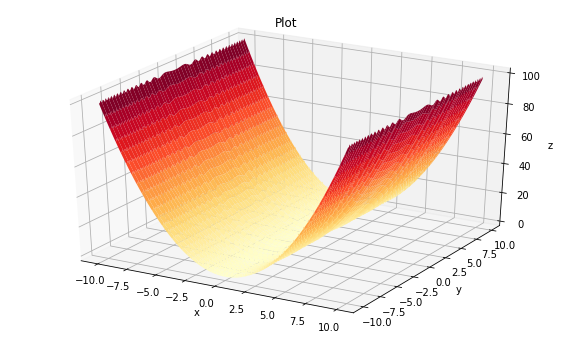

In [30]:
# setup the 3D grid of points
x = np.arange(-10, 10, 0.1)
y = np.arange(-10, 10, 0.1)

# restructure the variables for use in the 3D plot
X, Y = np.meshgrid(x, y)

# calculate the function value: z = x^2 + sin(y^2)
Z = (X ** 2) + np.sin(Y ** 2)

# initialize the 3D figure
fig = plt.figure(figsize=(10, 6))
ax = fig.gca(projection='3d')

# plot the surface
ax.plot_surface(X, Y, Z, cmap='YlOrRd')

# add labels
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
plt.title('Plot')

plt.show()

Let's take a step further and plot the 3D surface side-by-side with the slices. Run this code **as-is** and play around with the interactive sliders.

**NOTE:** The code may be slow to refresh, so be patient.

In [31]:
def plot_surface_problem3(x0, y0):
    
    # resolution
    delta = 0.1
    
    # set up the three subfigures
    fig = plt.figure(figsize=(14, 8))
    ax_3d = fig.add_subplot(1, 2, 1, projection='3d')
    ax_x_slice = fig.add_subplot(2, 2, 2)
    ax_y_slice = fig.add_subplot(2, 2, 4)
    
    #===========================
    # plot the x-slice (f(x, y) vs. y with x=constant)
    x = x0
    y = np.arange(-3, 3, delta)
    z = (x ** 2) + np.sin(y **2)
    ax_x_slice.plot(y, z, color='red')
    
    # add labels
    ax_x_slice.set_xlabel('y')
    ax_x_slice.set_ylabel('f(x, y)')
    
    #===========================
    # plot the y-slice (f(x, y) vs. x with y=constant)
    x = np.arange(-3, 3, delta)
    y = y0
    z = (x ** 2) + np.sin(y **2)
    ax_y_slice.plot(x, z, color='green', linestyle='--')
    
    # add labels
    ax_y_slice.set_xlabel('x')
    ax_y_slice.set_ylabel('f(x, y)')
    
    #===========================
    # plot the 3D surface
    x = np.arange(-3, 3, delta)
    y = np.arange(-3, 3, delta)
    X, Y = np.meshgrid(x, y)
    Z = (X ** 2) + np.sin(Y **2)
    ax_3d.plot_surface(X, Y, Z, cmap='Greys',
                      rstride=2,
                      cstride=2,
                      linewidth=0,
                      antialiased=True)
    
    # add labels
    ax_3d.set_xlabel('x')
    ax_3d.set_ylabel('y')
    ax_3d.set_zlabel('f(x, y)')
    
    # add the x-slice onto the 3D plot
    y = np.arange(-3, 3, delta)
    x = np.ones_like(y) * x0
    z = (x ** 2) + np.sin(y **2)
    ax_3d.plot(x, y, z, color='red', linestyle='-', linewidth=2)
    
    # add the y-slice onto the 3D plot
    x = np.arange(-3, 3, delta)
    y = np.ones_like(x) * y0
    z = (x ** 2) + np.sin(y **2)
    ax_3d.plot(x, y, z, color='green', linestyle='--', linewidth=2)
    
    
    # change the viewing angle of the 3D plot
    ax_3d.view_init(55, 65)
    plt.draw()
    
    # show the plot
    plt.show()
    

# try it out
interact(plot_surface_problem3,
         x0=FloatSlider(min=-3, max=3, step=0.1, continuous_update=False),
         y0=FloatSlider(min=-3, max=3, step=0.1, continuous_update=False)
        )

interactive(children=(FloatSlider(value=0.0, continuous_update=False, description='x0', max=3.0, min=-3.0), Fl…

<function __main__.plot_surface_problem3(x0, y0)>

## 3.4) What is the partial derivative with respect to x?
What is the partial derivative of $f(x, y)$ with respect to $x$?

**Answer:**

$$
\frac{\partial}{\partial x} f(x, y) = 2x
$$



## 3.5) Plot the partial derivative with respect to x
Now plot the partial derivative $\partial f/\partial x$ (in 2D) with x from -3 to 3.

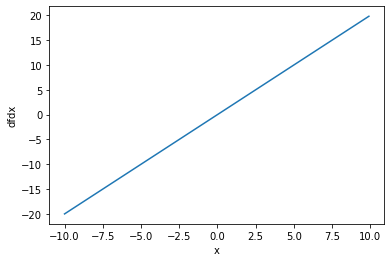

In [32]:
# choose a range of x-values
x = np.arange(-10, 10, 0.1)

# calculate df/dx
dfdx = 2 * x

# plot df/dx vs x
plt.plot(x, dfdx)

# add labels
plt.xlabel('x')
plt.ylabel('dfdx')

plt.show()

**Question:** What does the partial derivative look like? Any comments or observations about its shape (and possible meaning)?

**Answer:** A linear function. Straight line.

## 3.6) What is the partial derivative with respect to y?
What is the partial derivative of $f(x, y)$ with respect to $y$?

**Answer:**

$$
\frac{\partial}{\partial y} f(x, y) = cos(y ** 2) * 2y
$$



## 3.7) Plot the partial derivative with respect to y
Now plot the partial derivative $\partial f/\partial y$ (in 2D) with y from -3 to 3.

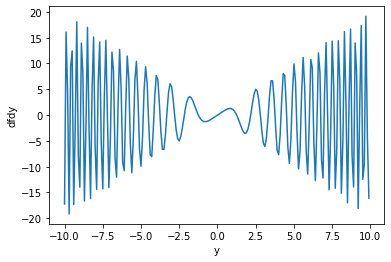

In [33]:
# choose a range of y-values
y = np.arange(-10, 10, 0.1)

# calculate df/dy
dfdy = np.cos(y**2) * 2 * y

# plot df/dy vs y
plt.plot(y, dfdy)

# add labels
plt.xlabel('y')
plt.ylabel('dfdy')

plt.show()

**Question:** What does the partial derivative look like? Any comments or observations about its shape (and possible meaning)?

**Answer:** A sine wave. It is similar to it's antiderivative.

**Optional challenge:** Try making a 3D plot of the partial derivatives (i.e. plot $\partial f/\partial x$ vs $x$ and $y$, and $\partial f/\partial y$ vs $x$ and $y$).

*Hint*: you can re-use the 3D plot code from Section 3.3.

## 4)  Submission
Once you have completed all the code sections and answered the questions, you will submit the lab via TritonEd:
1. rename your notebook to include your name (e.g. ``eng10_hw2_firstname_lastname``)
2. save your notebook (File >> Save and Checkpoint)
3. log into TritonEd (tritoned.ucsd.edu)
4. submit your file for HW 2 (e.g. ``eng10_hw2_firstname_lastname.ipynb``)

**NOTE**: Homework is due 11:59 PM on Wednesday, August 14. No late submissions will be accepted!